In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mushroom-dataset/mushroom_cleaned.csv


In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import cufflinks as cf
%matplotlib inline
cf.go_offline()

In [4]:
df=pd.read_csv("/kaggle/input/mushroom-dataset/mushroom_cleaned.csv")
df

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
0,1372,2,2,10,3.807467,1545,11,1.804273,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1
2,1371,2,2,10,3.612496,1566,11,1.804273,1
3,1261,6,2,10,3.787572,1566,11,1.804273,1
4,1305,6,2,10,3.711971,1464,11,0.943195,1
...,...,...,...,...,...,...,...,...,...
54030,73,5,3,2,0.887740,569,12,0.943195,1
54031,82,2,3,2,1.186164,490,12,0.943195,1
54032,82,5,3,2,0.915593,584,12,0.888450,1
54033,79,2,3,2,1.034963,491,12,0.888450,1


In [5]:
df.isna().sum()

cap-diameter       0
cap-shape          0
gill-attachment    0
gill-color         0
stem-height        0
stem-width         0
stem-color         0
season             0
class              0
dtype: int64

In [6]:
df['class'].unique()

array([1, 0])

In [7]:
df.describe()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
count,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000
mean,567.257204,4.000315,2.142056,7.329509,0.759110,1051.081299,8.418062,0.952163,0.549181
std,359.883763,2.160505,2.228821,3.200266,0.650969,782.056076,3.262078,0.305594,0.497580
min,0.000000,0.000000,0.000000,0.000000,0.000426,0.000000,0.000000,0.027372,0.000000
25%,289.000000,2.000000,0.000000,5.000000,0.270997,421.000000,6.000000,0.888450,0.000000
50%,525.000000,5.000000,1.000000,8.000000,0.593295,923.000000,11.000000,0.943195,1.000000
75%,781.000000,6.000000,4.000000,10.000000,1.054858,1523.000000,11.000000,0.943195,1.000000
max,1891.000000,6.000000,6.000000,11.000000,3.835320,3569.000000,12.000000,1.804273,1.000000


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54035 entries, 0 to 54034
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cap-diameter     54035 non-null  int64  
 1   cap-shape        54035 non-null  int64  
 2   gill-attachment  54035 non-null  int64  
 3   gill-color       54035 non-null  int64  
 4   stem-height      54035 non-null  float64
 5   stem-width       54035 non-null  int64  
 6   stem-color       54035 non-null  int64  
 7   season           54035 non-null  float64
 8   class            54035 non-null  int64  
dtypes: float64(2), int64(7)
memory usage: 3.7 MB


In [9]:
df.isnull().sum().sum()

0

<Axes: >

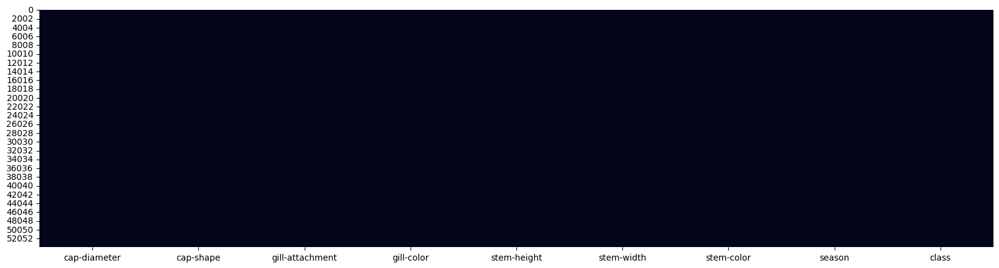

In [10]:
plt.figure(figsize=(20,5))
sns.heatmap(df.isnull(),cbar=False)

In [11]:
for i in df.columns:
    print("column")
    print(i)
    print(df[i].nunique())
    print("---------------")

column
cap-diameter
1847
---------------
column
cap-shape
7
---------------
column
gill-attachment
7
---------------
column
gill-color
12
---------------
column
stem-height
1455
---------------
column
stem-width
3510
---------------
column
stem-color
13
---------------
column
season
4
---------------
column
class
2
---------------


In [12]:
df.columns

Index(['cap-diameter', 'cap-shape', 'gill-attachment', 'gill-color',
       'stem-height', 'stem-width', 'stem-color', 'season', 'class'],
      dtype='object')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version

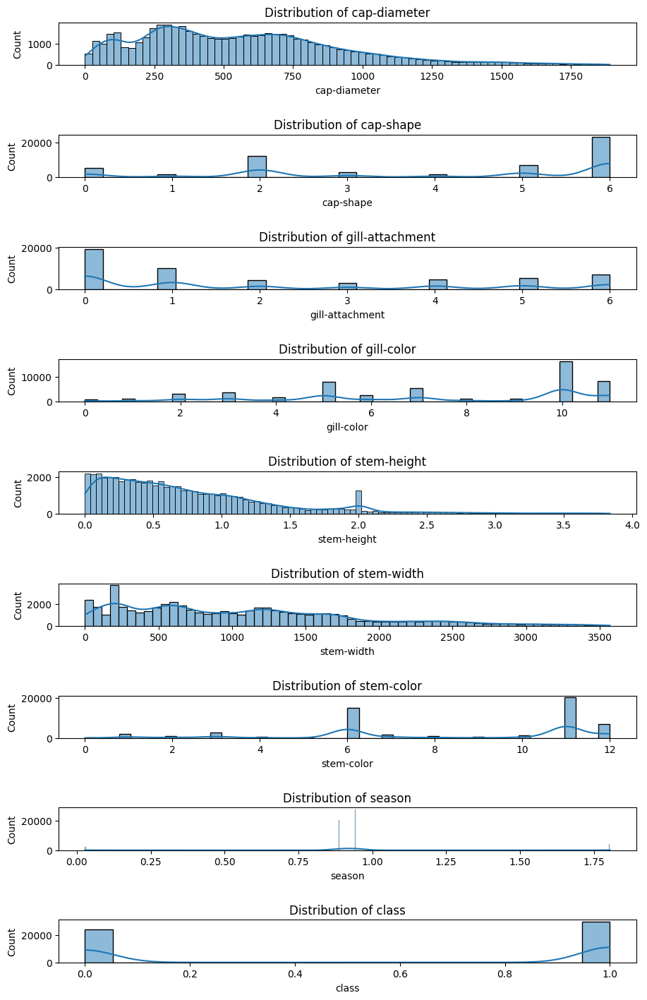

In [13]:
##Now we have some missing values, So lets make some visualization of it
cols_with_missing_values = ['cap-diameter', 'cap-shape', 'gill-attachment', 'gill-color',
       'stem-height', 'stem-width', 'stem-color', 'season', 'class']

# Plotting the distributions of columns with missing values
fig, axes = plt.subplots(len(cols_with_missing_values), 1, figsize=(10, 15))
fig.tight_layout(pad=5.0)

for i, col in enumerate(cols_with_missing_values):
  df[col] = df[col].replace([np.inf, -np.inf], np.nan)  # Replace inf and -inf with NaN
  sns.histplot(df[col], kde=True, ax=axes[i])
  axes[i].set_title(f'Distribution of {col}')
  axes[i].set_xlabel(col)
  axes[i].set_ylabel('Count')

plt.show()

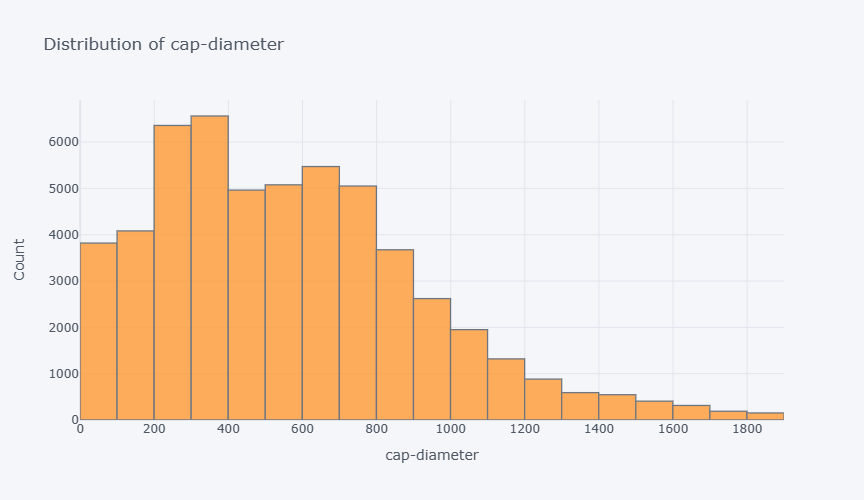

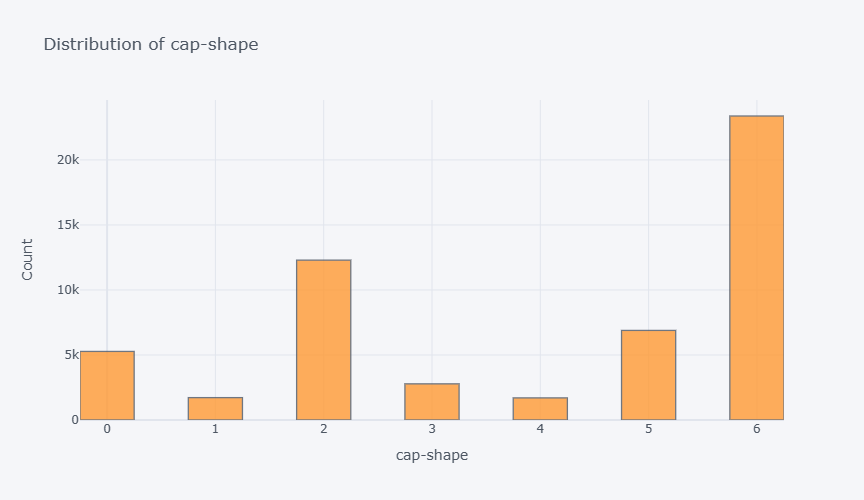

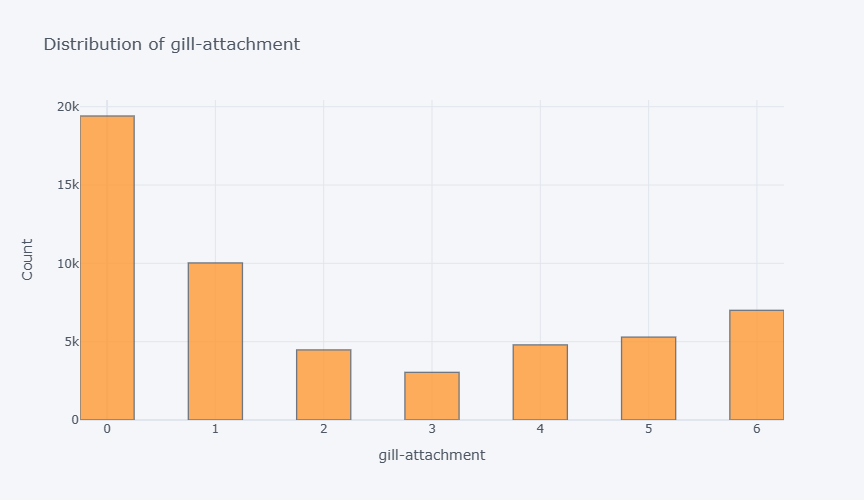

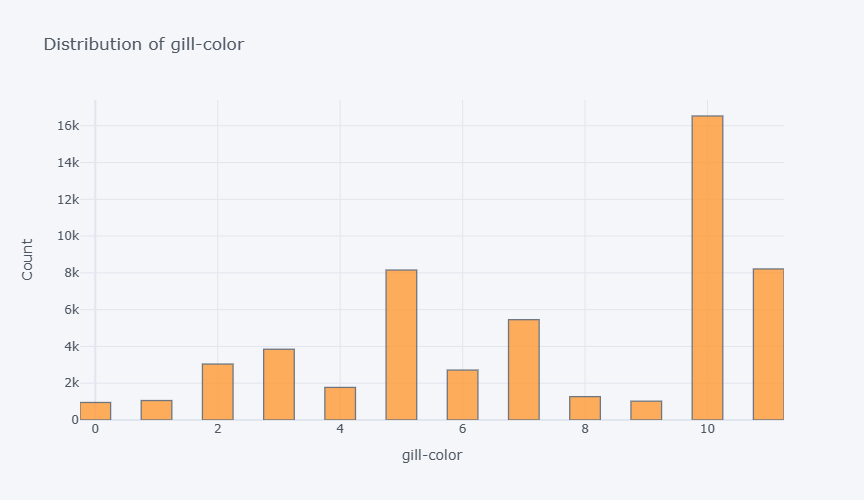

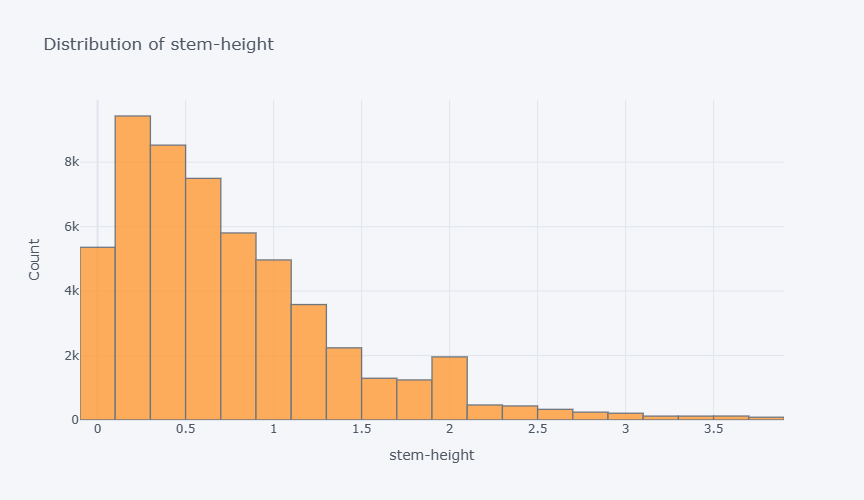

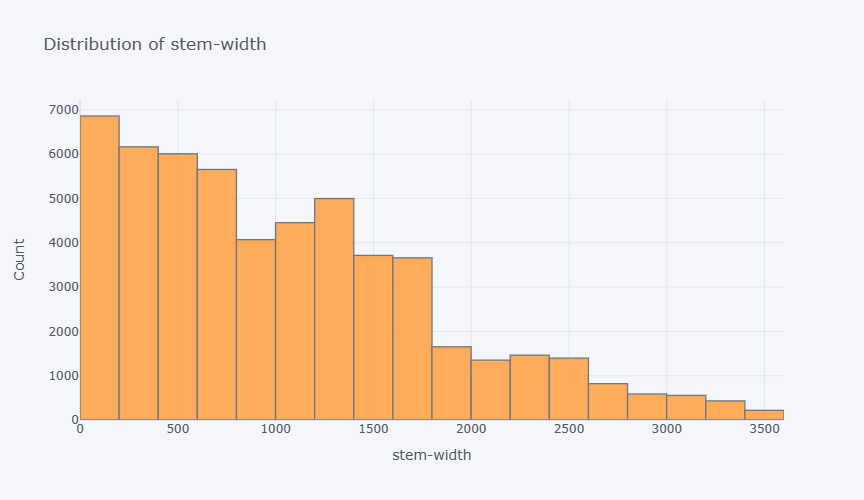

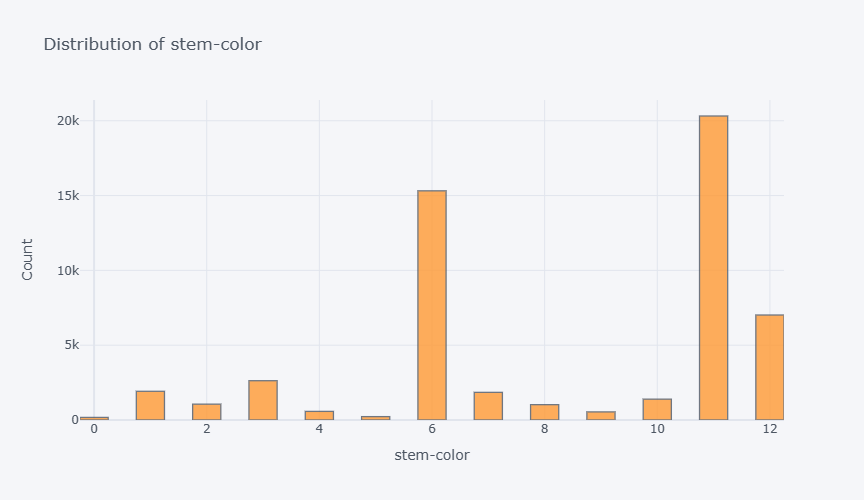

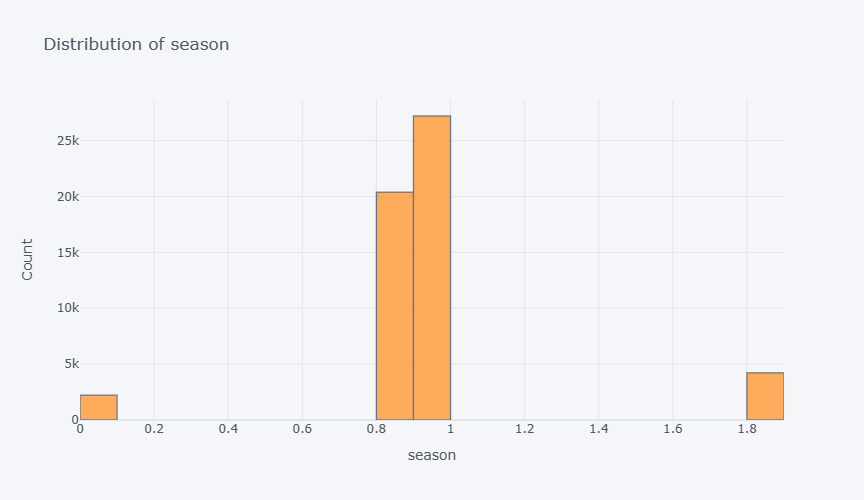

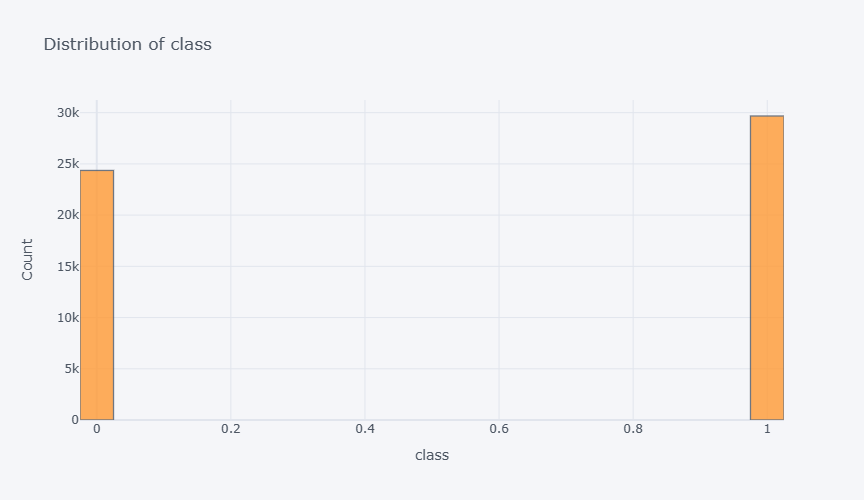

In [14]:
##Now we have some missing values, So lets make some visualization of it
cols_with_missing_values = ['cap-diameter', 'cap-shape', 'gill-attachment', 'gill-color',
       'stem-height', 'stem-width', 'stem-color', 'season', 'class']


# Plot the distributions using cufflinks and Plotly
for col in cols_with_missing_values:
    fig=df[col].iplot(kind='histogram', title=f'Distribution of {col}',
                       xTitle=col, yTitle='Count',
                       bins=30, dimensions=(500, 500), asFigure=True)
    fig.update_layout(showlegend=False)

    # Show the histogram
    fig.show()

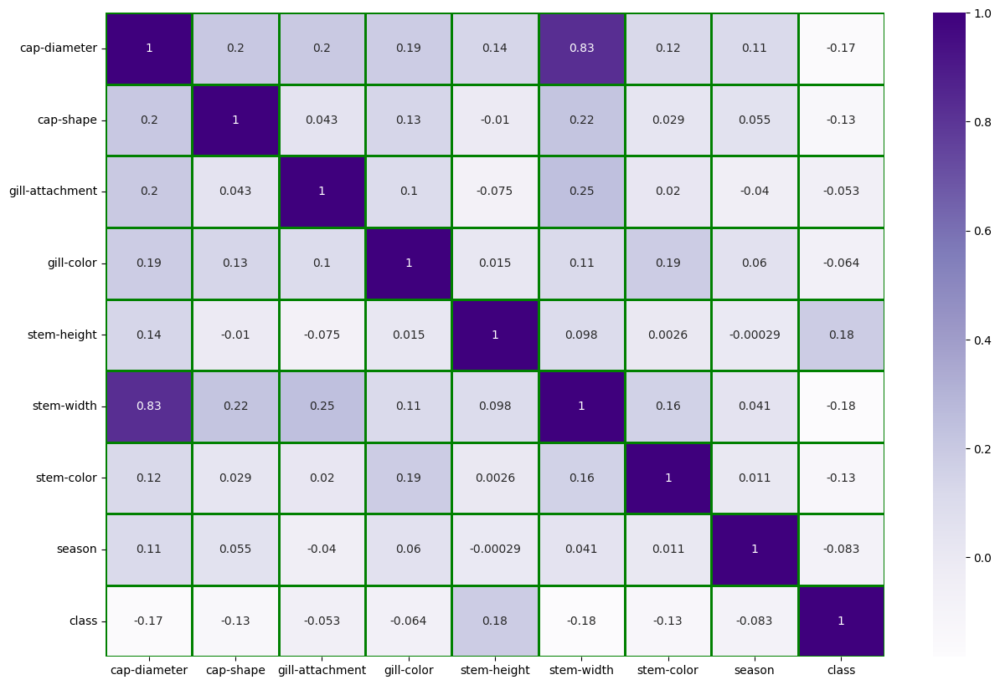

In [15]:
##to know the importance of features and extra features 
plt.figure(figsize = (15, 10)) 
sns.heatmap(df.corr(), cmap='Purples',annot=True, linecolor='Green', linewidths=1.0)
plt.show()

In [16]:
df.drop("stem-width",axis=1,inplace=True)
df

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-color,season,class
0,1372,2,2,10,3.807467,11,1.804273,1
1,1461,2,2,10,3.807467,11,1.804273,1
2,1371,2,2,10,3.612496,11,1.804273,1
3,1261,6,2,10,3.787572,11,1.804273,1
4,1305,6,2,10,3.711971,11,0.943195,1
...,...,...,...,...,...,...,...,...
54030,73,5,3,2,0.887740,12,0.943195,1
54031,82,2,3,2,1.186164,12,0.943195,1
54032,82,5,3,2,0.915593,12,0.888450,1
54033,79,2,3,2,1.034963,12,0.888450,1


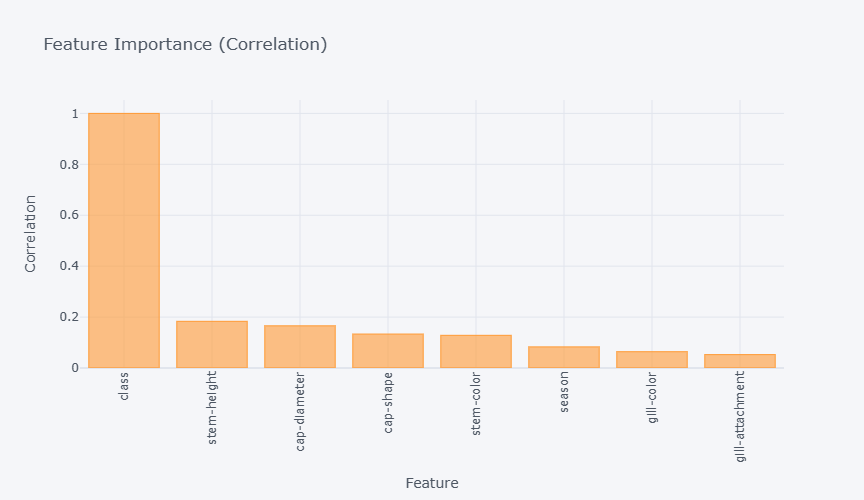

In [17]:
# Assuming you have a dataframe 'df' with features and a target variable 'target'
correlation = df.corr()['class']  # Replace 'target' with your actual target variable name

# Sort features by correlation (absolute value) in descending order
sorted_features = correlation.abs().sort_values(ascending=False)
bar_plot = sorted_features.iplot(kind='bar', xTitle='Feature', yTitle='Correlation',
                            title='Feature Importance (Correlation)',
                            dimensions=(800, 500), asFigure=True)
bar_plot.update_layout(xaxis_tickangle=-90, showlegend=False)

# Show the plot
bar_plot.show()

In [18]:
df.drop("gill-attachment",axis=1,inplace=True)
df

,cap-diameter,cap-shape,gill-color,stem-height,stem-color,season,class
0,1372,2,10,3.807467,11,1.804273,1
1,1461,2,10,3.807467,11,1.804273,1
2,1371,2,10,3.612496,11,1.804273,1
3,1261,6,10,3.787572,11,1.804273,1
4,1305,6,10,3.711971,11,0.943195,1
...,...,...,...,...,...,...,...
54030,73,5,2,0.887740,12,0.943195,1
54031,82,2,2,1.186164,12,0.943195,1
54032,82,5,2,0.915593,12,0.888450,1
54033,79,2,2,1.034963,12,0.888450,1


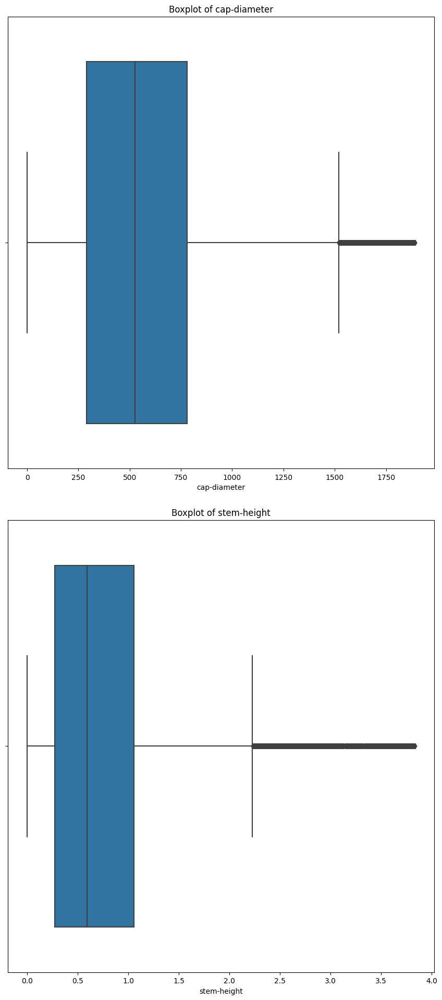

In [19]:
# Selecting continuous variables for outlier detection
continuous_cols = ['cap-diameter',
       'stem-height']
# Plotting the boxplots for continuous variables
fig, axes = plt.subplots(len(continuous_cols), 1, figsize=(10, 20))
fig.tight_layout(pad=5.0)

for i, col in enumerate(continuous_cols):
    sns.boxplot(x=df[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_xlabel(col)

plt.show()

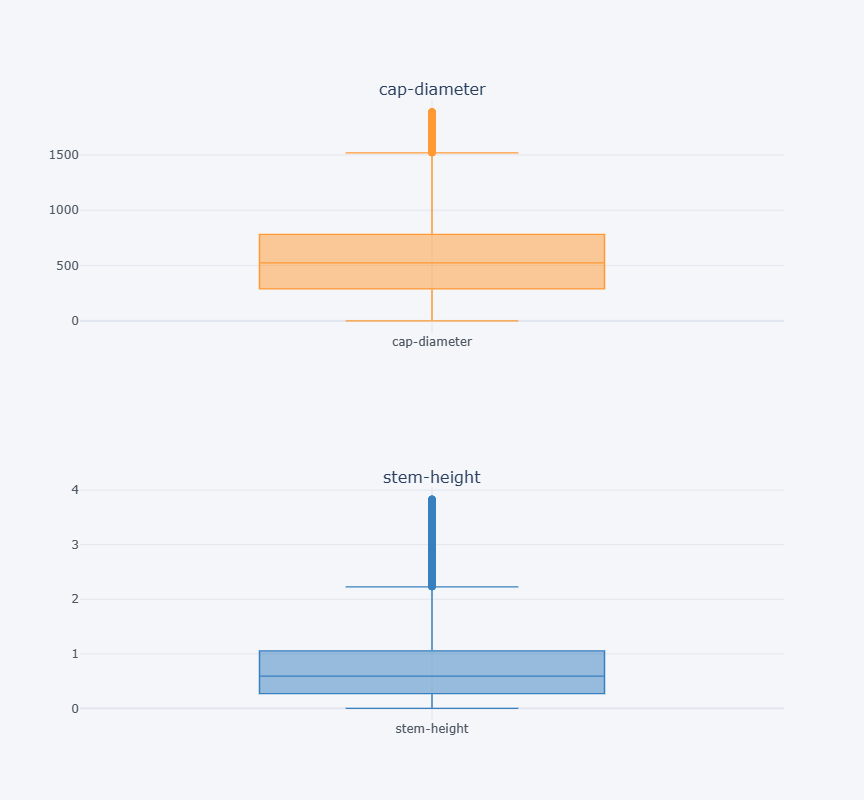

In [20]:
# Create the boxplots using Cufflinks and Plotly
fig = df[continuous_cols].iplot(kind='box', subplots=True,boxpoints='outliers', shape=(len(continuous_cols), 1),
                                 subplot_titles=continuous_cols, asFigure=True)

# Update the layout of the boxplots
fig['layout'].update(height=len(continuous_cols) * 400, showlegend=False)

# Adjust the outlier symbol and marker size
for i, trace in enumerate(fig['data']):
    trace.marker.update(symbol='circle-open', size=6)
    
    

fig.show()

In [21]:
def handle_outliers_with_IQR(df, column):
    ### Handle outliers in a dataframe column using the IQR method.
    ### Values outside 1.5 * IQR from the Q1 and Q3 quartiles are considered outliers.
    
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    df[column] = df[column].clip(lower=lower_bound, upper=upper_bound)

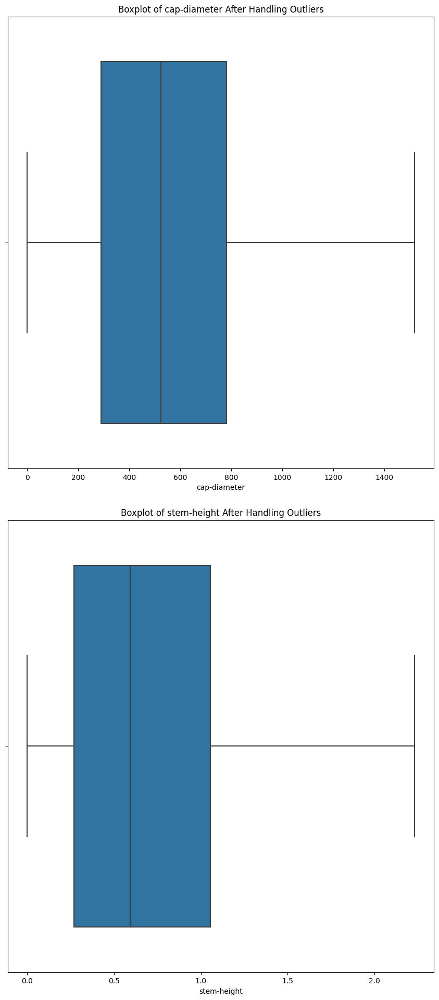

In [22]:
# Applying the IQR method to each continuous column
for col in continuous_cols:
    handle_outliers_with_IQR(df, col)

# Plotting the boxplots for continuous variables after handling outliers
fig, axes = plt.subplots(len(continuous_cols), 1, figsize=(10, 20))
fig.tight_layout(pad=5.0)

for i, col in enumerate(continuous_cols):
    sns.boxplot(x=df[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col} After Handling Outliers')
    axes[i].set_xlabel(col)

plt.show()

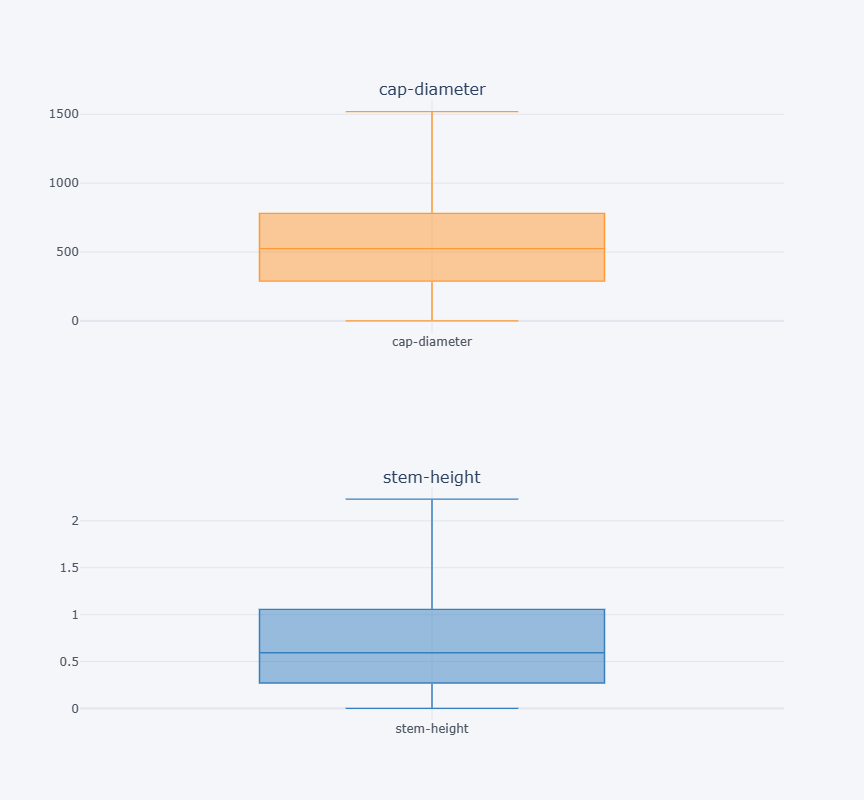

In [23]:
fig = df[continuous_cols].iplot(kind='box', subplots=True,boxpoints='outliers', shape=(len(continuous_cols), 1),
                                 subplot_titles=continuous_cols, asFigure=True)

# Update the layout of the boxplots
fig['layout'].update(height=len(continuous_cols) * 400, showlegend=False)

# Adjust the outlier symbol and marker size
for i, trace in enumerate(fig['data']):
    trace.marker.update(symbol='circle-open', size=6)
    
    

fig.show()

# 1. * ******EDA and VISUALIZATION

In [24]:
df.head()

,cap-diameter,cap-shape,gill-color,stem-height,stem-color,season,class
0,1372,2,10,2.230649,11,1.804273,1
1,1461,2,10,2.230649,11,1.804273,1
2,1371,2,10,2.230649,11,1.804273,1
3,1261,6,10,2.230649,11,1.804273,1
4,1305,6,10,2.230649,11,0.943195,1


In [25]:
df.columns

Index(['cap-diameter', 'cap-shape', 'gill-color', 'stem-height', 'stem-color',
       'season', 'class'],
      dtype='object')

In [26]:
# Defining 3 lists containing the column names of
# a. dependent variables
# b. continuous independent variables
# c. categorical independent variables

dependent_var = ['class']
continuous_var = ['cap-diameter',  'stem-height',
       'season']
categorical_var = ['cap-shape', 'gill-color','stem-color']

<Figure size 1000x500 with 0 Axes>

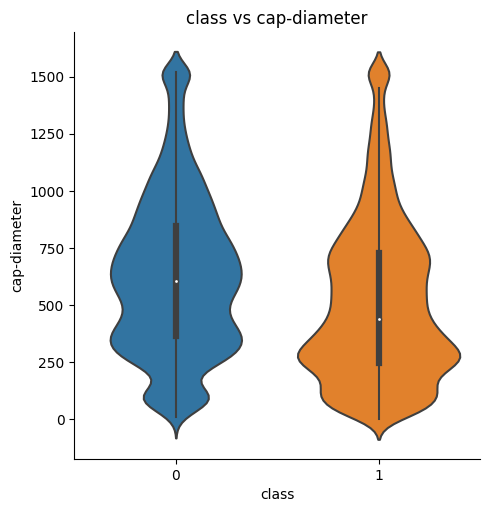

<Figure size 1000x500 with 0 Axes>

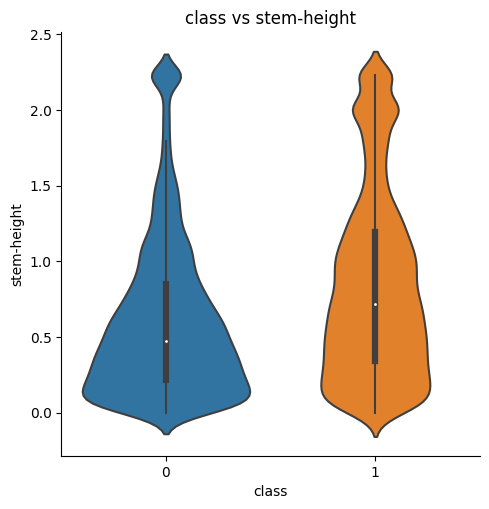

<Figure size 1000x500 with 0 Axes>

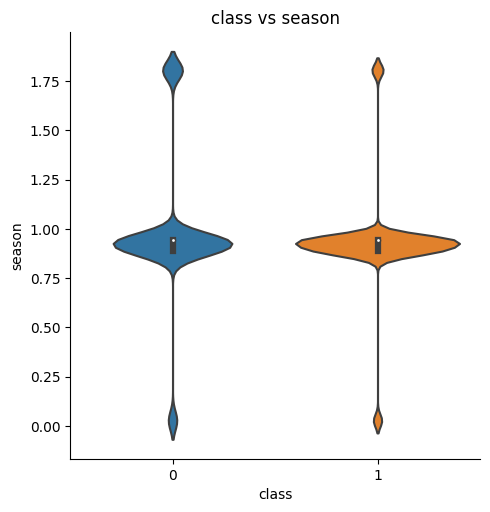

In [27]:
# Relationship between the dependent variable and continuous independent variables
for i in continuous_var:
  plt.figure(figsize=(10,5))
  sns.catplot(x=dependent_var[0],y=i,data=df,kind='violin')
  plt.ylabel(i)
  plt.xlabel(dependent_var[0])
  plt.title(dependent_var[0]+' vs '+i)
  plt.show()

<Figure size 1000x500 with 0 Axes>

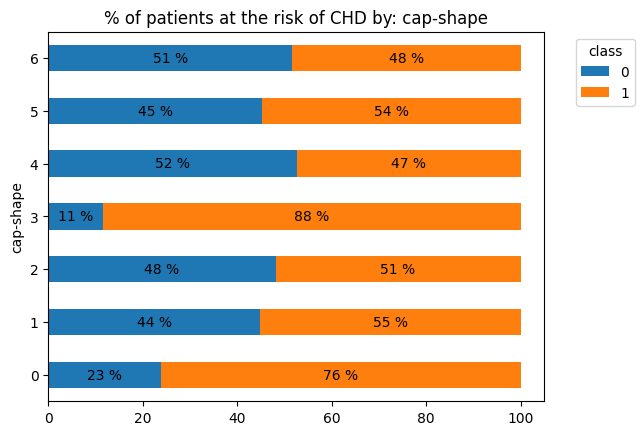

<Figure size 1000x500 with 0 Axes>

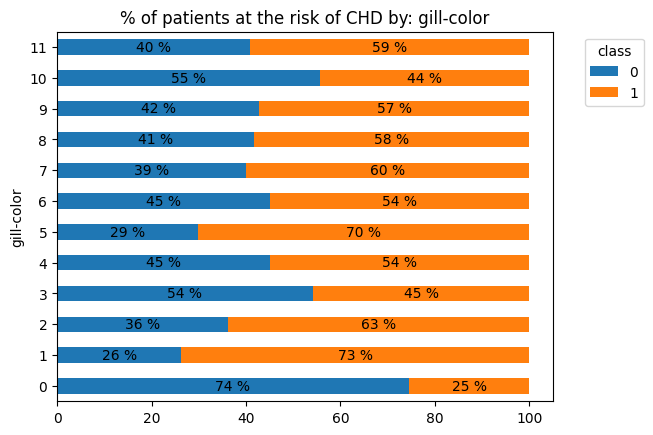

<Figure size 1000x500 with 0 Axes>

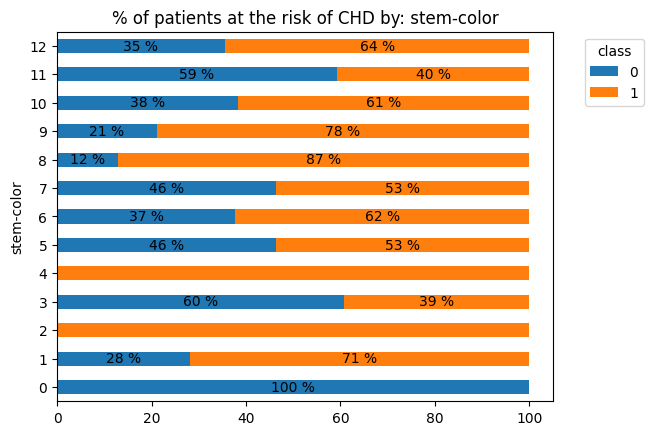

In [28]:
# Analyzing the relationship between the dependent variable and categorical independent variables
# Stacked bar chart

for i in categorical_var:
    x_var, y_var = i, dependent_var[0]
    plt.figure(figsize=(10,5))
    cardio_grouped = df.groupby(x_var)[y_var].value_counts(normalize=True).unstack(y_var)*100
    cardio_grouped.plot.barh(stacked=True)
    plt.legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        title=y_var)

    plt.title("% of patients at the risk of CHD by: "+i)
    for ix, row in cardio_grouped.reset_index(drop=True).iterrows():
        # print(ix, row)
        cumulative = 0
        for element in row:
            if element > 0.1:
                plt.text(
                    cumulative + element / 2,
                    ix,
                    f"{int(element)} %",
                    va="center",
                    ha="center",
                )
            cumulative += element
    plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version

<Figure size 1500x1000 with 0 Axes>

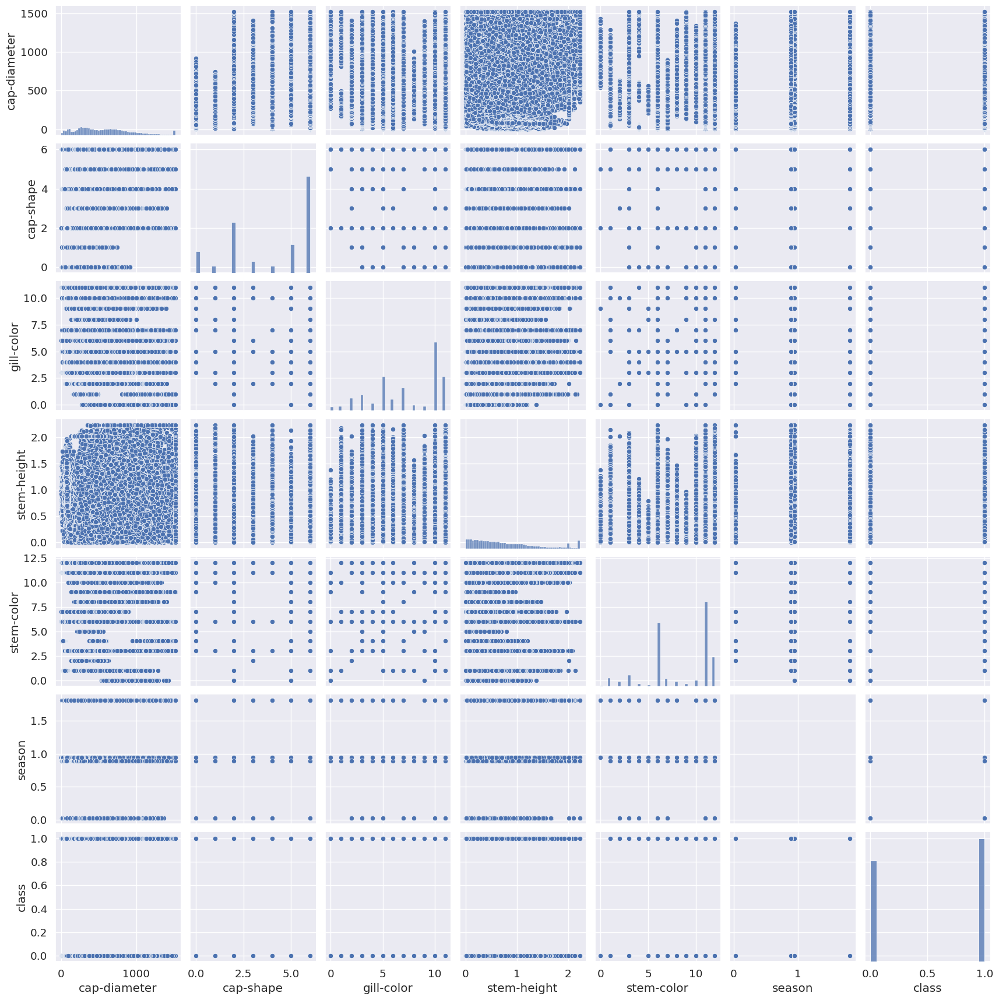

In [29]:
sns.set(font_scale=1.2)  
plt.figure(figsize=(15, 10), dpi=100)  
sns.pairplot(df)
plt.show()

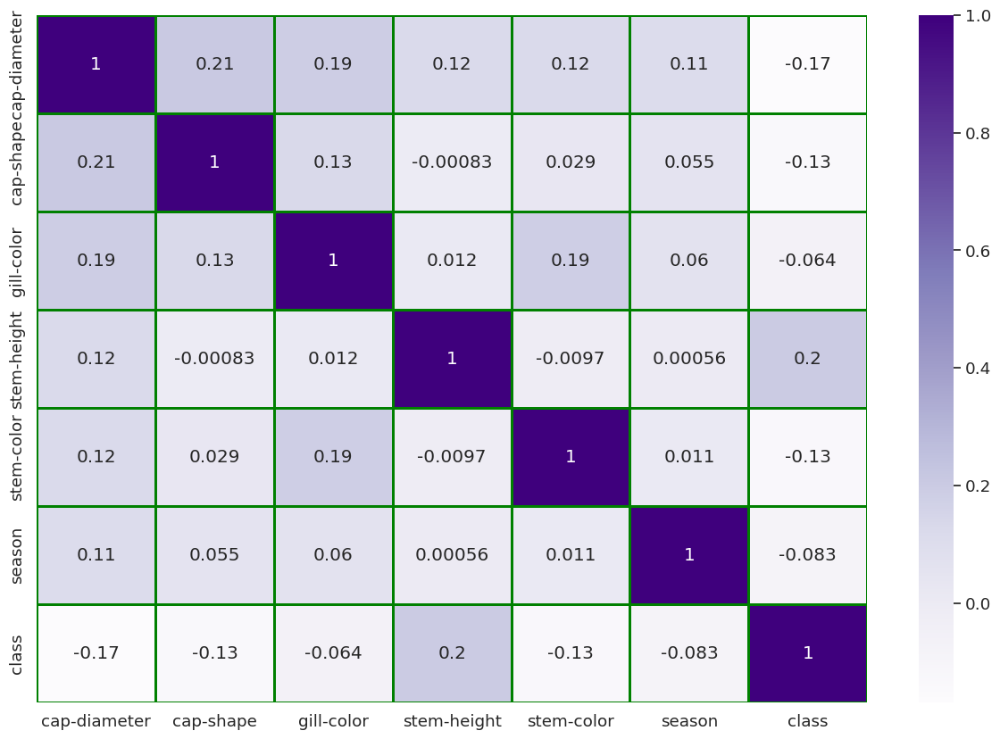

In [30]:
plt.figure(figsize = (15, 10)) 
sns.heatmap(df.corr(), cmap='Purples',annot=True, linecolor='Green', linewidths=1.0)
plt.show()

In [31]:
df.columns

Index(['cap-diameter', 'cap-shape', 'gill-color', 'stem-height', 'stem-color',
       'season', 'class'],
      dtype='object')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



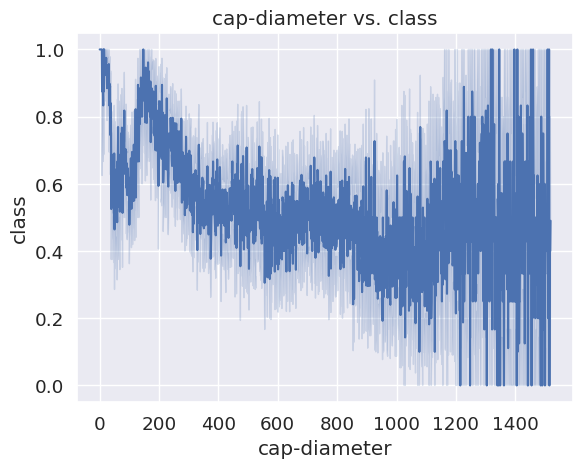

In [32]:
# Line plot to observe trends over time 
sns.lineplot(x='cap-diameter', y='class', data=df)
plt.title("cap-diameter vs. class")
plt.show()

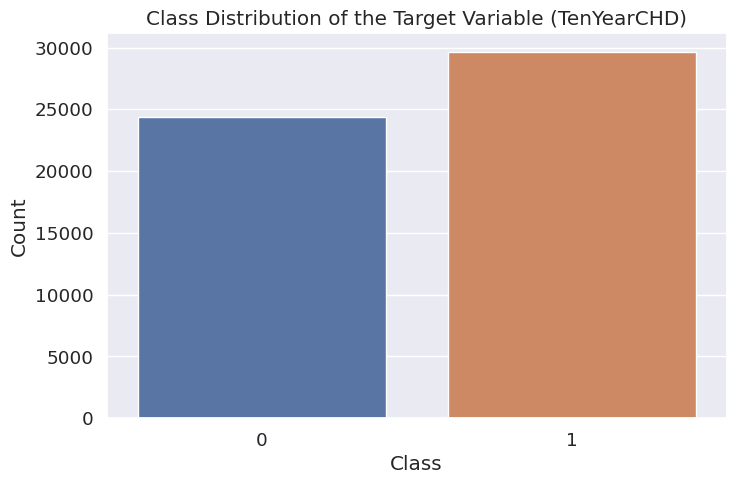

In [33]:
#Now lets check the data is imbalanced or not


target_column = 'class'
class_counts = df[target_column].value_counts()

# Plotting the class distribution
plt.figure(figsize=(8, 5))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.title('Class Distribution of the Target Variable (TenYearCHD)')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

the classes seem balanced enough****

In [34]:
y = df['class']
df.drop("class",axis=1,inplace=True)
X=df
X

,cap-diameter,cap-shape,gill-color,stem-height,stem-color,season
0,1372,2,10,2.230649,11,1.804273
1,1461,2,10,2.230649,11,1.804273
2,1371,2,10,2.230649,11,1.804273
3,1261,6,10,2.230649,11,1.804273
4,1305,6,10,2.230649,11,0.943195
...,...,...,...,...,...,...
54030,73,5,2,0.887740,12,0.943195
54031,82,2,2,1.186164,12,0.943195
54032,82,5,2,0.915593,12,0.888450
54033,79,2,2,1.034963,12,0.888450


In [35]:
from sklearn.model_selection import train_test_split


X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=42)

In [36]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [37]:
from sklearn.ensemble import RandomForestClassifier
# Create a random forest classifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [38]:
rf.score(X_train,y_train)

0.9998678079249149

In [39]:
rf.score(X_val,y_val)

0.923331130204891

In [40]:
rf.score(X_test,y_test)

0.9230152365677626

In [55]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier
knn = KNeighborsClassifier(n_neighbors=3)

# Fit the classifier to the data
knn.fit(X_train, y_train)
knn.score(X_train,y_train)

0.8798374037476453

In [64]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score


In [79]:
def predicting(model):
    y_pred = model.predict(X_test)
    # Accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Accuracy: {accuracy}')

# Precision
    precision = precision_score(y_test, y_pred)
    print(f'Precision: {precision}')

# Recall
    recall = recall_score(y_test, y_pred)
    print(f'Recall: {recall}')

# F1 Score
    f2 = f1_score(y_test, y_pred)
    print(f'F1 Score: {f1}')

# AUC-ROC
    auc_roc = roc_auc_score(y_test, y_pred)
    print(f'AUC-ROC: {auc_roc}')
    return {"accuracy": accuracy,"precision":precision,"recall":recall,"f1-score":f2}

In [80]:
#random forest classifer prediction
rfpred = predicting(rf)

Accuracy: 0.9230152365677626
Precision: 0.9331058020477816
Recall: 0.9255247122545701
F1 Score: 0.7716733295259851
AUC-ROC: 0.9227569132098814


In [81]:
#knn classifer prediction
knnpred = predicting(knn)

Accuracy: 0.7533773363765345
Precision: 0.7812210915818686
Recall: 0.7623561272850372
F1 Score: 0.7716733295259851
AUC-ROC: 0.752453067044342


In [82]:
knnpred

{'accuracy': 0.7533773363765345,
 'precision': 0.7812210915818686,
 'recall': 0.7623561272850372,
 'f1-score': 0.7716733295259851}

In [94]:
results_df

,accuracy,precision,recall,f1-score
0,0.923015,0.933106,0.925525,0.9293


In [85]:
results_df = pd.DataFrame([knnpred])

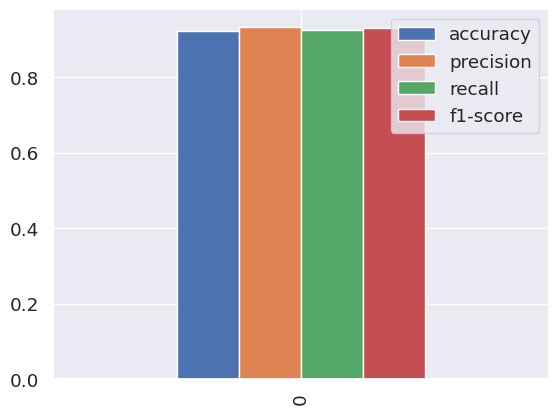

In [93]:
results_df.plot.bar(rot=0)
plt.show()

In [91]:
results_df = pd.DataFrame([rfpred])

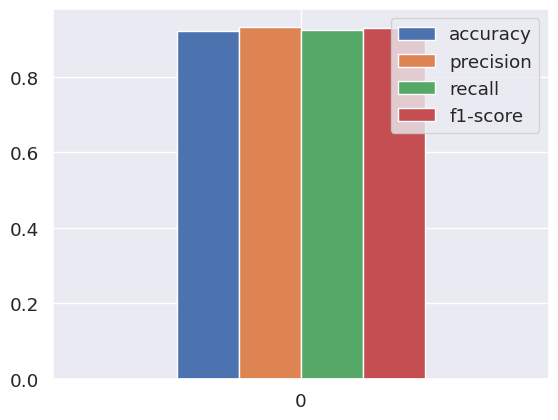

In [92]:
results_df.plot.bar(rot=0)
plt.show()